In [1]:
import os,sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import Tensor

import plotly.offline as py
import plotly.graph_objs as go
import plotly

plt.style.use('dark_background')
sys.path.append(os.pardir)

In [2]:
from module.rrl import RRL

In [3]:
fivemin = pd.read_json('../data/bitflyer_btcjpy_300_seconds.json')

In [4]:
fivemin.index = fivemin.index.astype(int)
fivemin.sort_index(inplace=True)

In [5]:
fivemin[fivemin['ClosePrice']==0]

,ClosePrice,CloseTime,CloseTime[JST],CloseTime[UTC],HighPrice,LowPrice,OpenPrice,Volume[BTC],Volume[JPY]
1480,0,1519412700,1519445100000,1519412700000,0,0,0,0.0,0.0


In [6]:
fivemin.drop(1480,inplace=True)

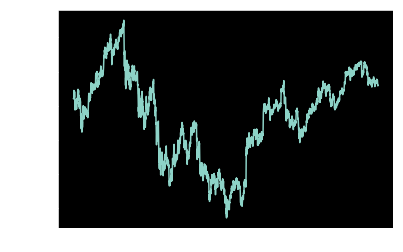

In [7]:
plt.plot(fivemin['ClosePrice'].values[:4000])
plt.show()

In [8]:
z = fivemin['ClosePrice'].values[:4000] / 1000

In [9]:
rrl=RRL(eta=0.05, m=4, delta=0.001, rho=0.1, mu=1, alpha=0)

In [10]:
rrl.fit(z,n_iter=10)

progress... 10 % , elapsed time... 3 sec
progress... 20 % , elapsed time... 6 sec
progress... 30 % , elapsed time... 8 sec
progress... 40 % , elapsed time... 11 sec
progress... 50 % , elapsed time... 13 sec
progress... 60 % , elapsed time... 15 sec
progress... 70 % , elapsed time... 18 sec
progress... 80 % , elapsed time... 20 sec
progress... 90 % , elapsed time... 24 sec
progress... 100 % , elapsed time... 27 sec


In [11]:
rrl.plot_results(filename='../plotly/example_results.html')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



In [12]:
rrl.plot_parameters(filename='../plotly/example_parameters.html')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]
[ (2,1) x4,y4 ]  [ (2,2) x5,y5 ]  [ (2,3) x6,y6 ]
[ (3,1) x7,y7 ]  [ (3,2) x8,y8 ]  [ (3,3) x9,y9 ]

